### CycleGAN

In this notebook we will follow [this](https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/cyclegan.ipynb#scrollTo=wDaGZ3WpZUyw) tutorial notebook from tensorflow to understand how to implement a `CycleGAN` in tensorflow.

> This notebook demonstrates unpaired image to image translation using conditional GAN's, as described in [Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks](https://arxiv.org/abs/1703.10593), also known as CycleGAN.

The paper proposes a method that can capture the characteristics of one image domain and figure out how these characteristics could be translated into another image domain, all in the absence of any paired training examples.

`CycleGAN` uses a _cycle consistency_ loss to enable training without the need for paired data. In other words, it can translate from one domain to another without a one-to-one mapping between the source and target domain.

### CycleGANs are capable of doing the following task:
* photo-enhancement
* image colorization
* style transfer
* e.t.c

### Setup
Install the [tensorflow_examples](https://github.com/tensorflow/examples) package that enables importing of the generator and the discriminator.

In [ ]:
!pip install git+https://github.com/tensorflow/examples.git

In [3]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix

import os, time
import matplotlib.pyplot as plt
import numpy as np

from prettytable import PrettyTable

AUTOTUNE = tf.data.AUTOTUNE

tf.__version__

'2.5.0'

### Input pipeline.

In this notebook we are going to follow the mentioned tutorial to translate images of horses to image of zebras. Datasets for this task can be found [here](https://www.tensorflow.org/datasets/catalog/cycle_gan).

Just like what we did on pix2pix model we are also going to apply random jittering and mirroring to the training dataset and normalize the train as well as the tests examples.

* In random jittering, the image is resized to `286 x 286` and then randomly cropped to `256 x 256`.
* In random mirroring, the image is randomly flipped horizontally i.e left to right.
* We are going to normalize the image so that each pixel value will be in range `[-1, 1]`.

In [30]:
dataset, metadata = tfds.load(
    'cycle_gan/horse2zebra',
    with_info=True,
    as_supervised=True
)

train_horses, train_zebras = dataset['trainA'], dataset['trainB']
test_horses, test_zebras = dataset['testA'], dataset['testB']

### Hyper parameters.

In [10]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

### Random cropping

In [11]:
def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3]
  )
  return cropped_image

### Normalizing images.

In [12]:
def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

### Random `jittering`

In [13]:
def random_jitter(image):
  image = tf.image.resize(image,[286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
                          )
  image = random_crop(image)
  image = tf.image.random_flip_left_right(image)
  return image

Just like what we did in pix2pix model we are also going to create preprocessing functions for train images and test images.

**Note:** Again we are not going to apply random jittering on the test images.

In [14]:
def process_image_train(image, label):
  image = random_jitter(image)
  image = normalize(image)
  return image

def process_image_test(image, label):
  return normalize(image)

### Datasets.

In [31]:
train_horses = train_horses.cache().map(
    process_image_train, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

train_zebras = train_zebras.cache().map(
    process_image_train, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

test_horses = test_horses.cache().map(
    process_image_test, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

test_zebras = test_zebras.cache().map(
    process_image_test, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

### Checking how many example do we have.

In [32]:
colums_data = "SUBSET", "EXAMPLE(s)"
rows_data = [
             ["training(horses)", f'{len(train_horses):,}'], 
             ["training(zebras)", f'{len(train_zebras):,}'],
             ["testing(horses)", f'{len(test_horses):,}'], 
             ["testing(zebras)", f'{len(test_zebras):,}'],
  ]
title = "TOTAL EXAMPLES FOR ALL SUBSETS"
def tabulate_example(column_names, data, title):
  table = PrettyTable(column_names)
  table.title= title
  table.align[column_names[0]] = 'l'
  table.align[column_names[1]] = 'r'
  for row in data:
    table.add_row(row)
  print(table)
tabulate_example(colums_data, rows_data, title)

+---------------------------------+
|  TOTAL EXAMPLES FOR ALL SUBSETS |
+-------------------+-------------+
| SUBSET            |  EXAMPLE(s) |
+-------------------+-------------+
| training(horses)  |       1,067 |
| training(zebras)  |       1,334 |
| testing(horses)   |         120 |
| testing(zebras)   |         140 |
+-------------------+-------------+


In [18]:
sample_horse = next(iter(train_horses))
sample_zebra = next(iter(train_zebras))

### Checking images 

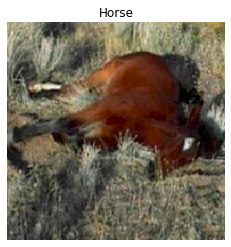

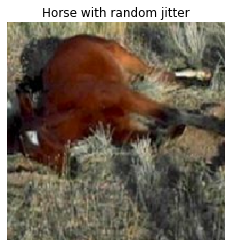

In [23]:
plt.imshow(sample_horse[0] * 0.5 + 0.5, cmap="gray")
plt.title("Horse")
plt.axis('off')
plt.show()

plt.imshow(random_jitter(sample_horse[0]) * 0.5 + 0.5, cmap="gray")
plt.title("Horse with random jitter")
plt.axis('off')
plt.show()


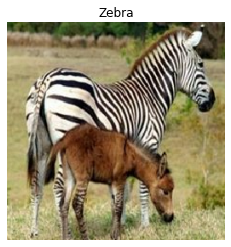

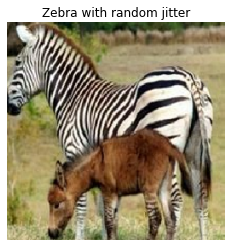

In [24]:
plt.imshow(sample_zebra[0] * 0.5 + 0.5, cmap="gray")
plt.title("Zebra")
plt.axis('off')
plt.show()

plt.imshow(random_jitter(sample_zebra[0]) * 0.5 + 0.5, cmap="gray")
plt.title("Zebra with random jitter")
plt.axis('off')
plt.show()

### Next.

We will import the generator and the discriminator used in [Pix2Pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py) via the installed [tensorflow_examples](https://github.com/tensorflow/examples) package.

**Note that later on we will create our generator and discriminator from scratch**

The model architecture used in this notebook is very similar to what was used in [pix2pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py). Some of the differences are:

* Cyclegan uses [instance normalization](https://arxiv.org/abs/1607.08022) instead of [batch normalization](https://arxiv.org/abs/1502.03167).
* The [CycleGAN paper](https://arxiv.org/abs/1703.10593) uses a modified `resnet` based generator. This tutorial is using a modified `unet` generator for simplicity.

There are 2 generators (G and F) and 2 discriminators (X and Y) being trained here. 

* Generator `G` learns to transform image `X` to image `Y`. $(G: X -> Y)$
* Generator `F` learns to transform image `Y` to image `X`. $(F: Y -> X)$
* Discriminator `D_X` learns to differentiate between image `X` and generated image `X` (`F(Y)`).
* Discriminator `D_Y` learns to differentiate between image `Y` and generated image `Y` (`G(X)`).

![Cyclegan model](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/cyclegan_model.png?raw=1)

In [33]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

In [34]:
generator_f.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
sequential_15 (Sequential)      (None, None, None, 6 3072        input_2[0][0]                    
__________________________________________________________________________________________________
sequential_16 (Sequential)      (None, None, None, 1 131328      sequential_15[0][0]              
__________________________________________________________________________________________________
sequential_17 (Sequential)      (None, None, None, 2 524800      sequential_16[0][0]              
____________________________________________________________________________________________

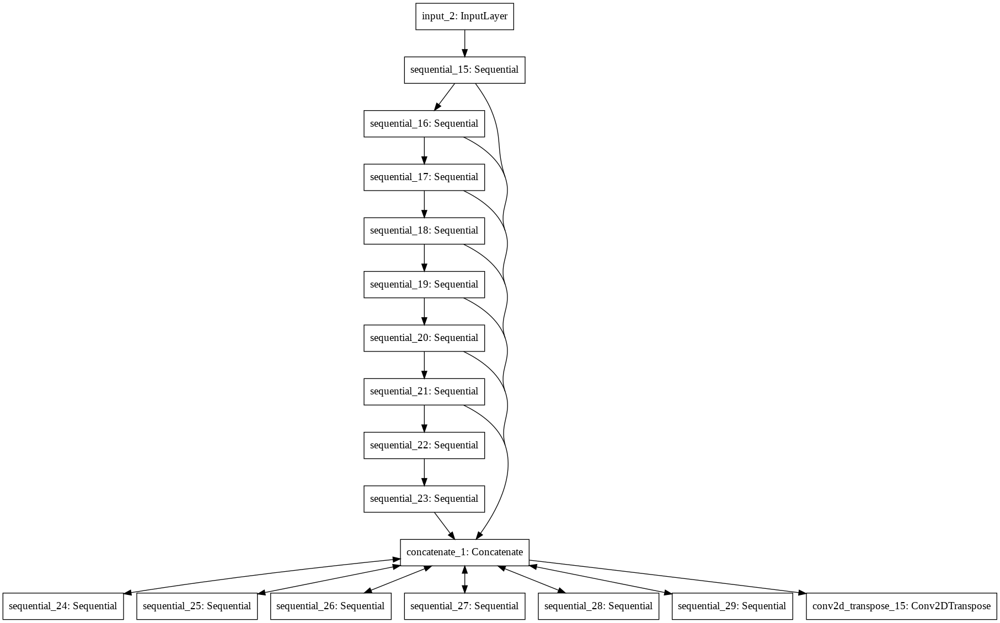

In [36]:
tf.keras.utils.plot_model(generator_f)

In [35]:
discriminator_y.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_image (InputLayer)     [(None, None, None, 3)]   0         
_________________________________________________________________
sequential_33 (Sequential)   (None, None, None, 64)    3072      
_________________________________________________________________
sequential_34 (Sequential)   (None, None, None, 128)   131328    
_________________________________________________________________
sequential_35 (Sequential)   (None, None, None, 256)   524800    
_________________________________________________________________
zero_padding2d_2 (ZeroPaddin (None, None, None, 256)   0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, None, None, 512)   2097152   
_________________________________________________________________
instance_normalization_33 (I (None, None, None, 512)   1024

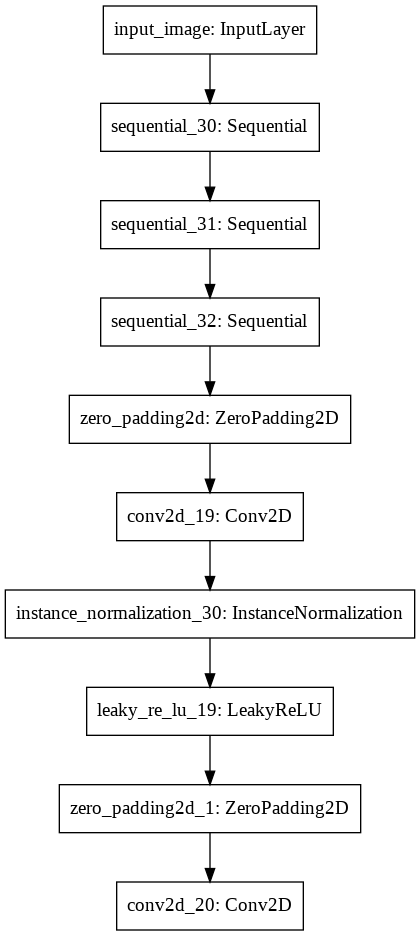

In [37]:
tf.keras.utils.plot_model(discriminator_x)

### Testing the generators.

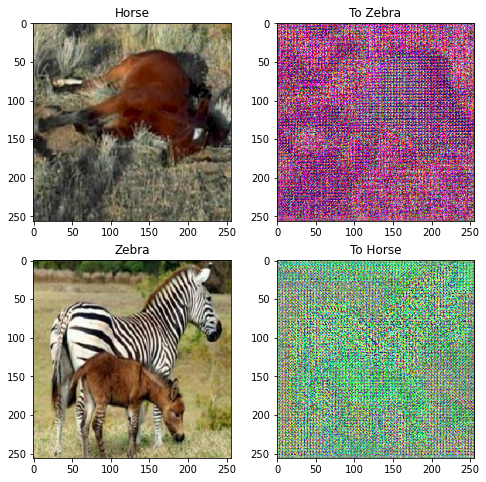

In [38]:
to_zebra = generator_g(sample_horse)
to_horse = generator_f(sample_zebra)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_horse, to_zebra, sample_zebra, to_horse]
title = ['Horse', 'To Zebra', 'Zebra', 'To Horse']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

### Testing the descriminator.

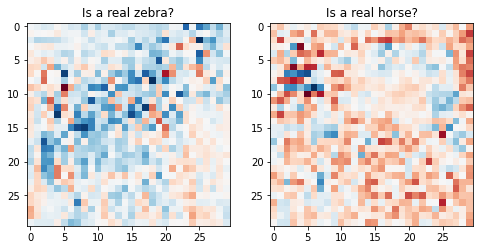

In [39]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real zebra?')
plt.imshow(discriminator_y(sample_zebra)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real horse?')
plt.imshow(discriminator_x(sample_horse)[0, ..., -1], cmap='RdBu_r')

plt.show()

### Loss functions.

In `CycleGAN`, there is no paired data to train on, hence there is no guarantee that the input `x` and the target `y` pair are meaningful during training. Thus in order to enforce that the network learns the correct mapping, the authors propose the cycle consistency loss.

The discriminator loss and the generator loss are similar to the ones used in `pix2pix`.

In [40]:
LAMBDA = 10

In [41]:
criterion = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [42]:
def discriminator_loss(real, generated):
  real_loss = criterion(tf.ones_like(real), real)
  generated_loss = criterion(tf.zeros_like(generated), generated)
  total_disc_loss = real_loss + generated_loss
  return total_disc_loss * .5

def generator_loss(generated):
  return criterion(tf.ones_like(generated), generated)

> Cycle consistency means the result should be close to the original input. For example, if one translates a sentence from English to French, and then translates it back from French to English, then the resulting sentence should be the same as the original sentence.

In cycle consistency loss, 

* Image $X$ is passed via generator $G$ that yields generated image $\hat{Y}$.
* Generated image $\hat{Y}$ is passed via generator $F$ that yields cycled image $\hat{X}$.
* Mean absolute error is calculated between $X$ and $\hat{X}$.

$$forward\ cycle\ consistency\ loss: X -> G(X) -> F(G(X)) \sim \hat{X}$$

$$backward\ cycle\ consistency\ loss: Y -> F(Y) -> G(F(Y)) \sim \hat{Y}$$


![Cycle loss](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/cycle_loss.png?raw=1)

In [43]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  return LAMBDA * loss1

As shown above, generator $G$ is responsible for translating image $X$ to image $Y$. Identity loss says that, if you fed image $Y$ to generator $G$, it should yield the real image $Y$ or something close to image $Y$.

If you run the zebra-to-horse model on a horse or the horse-to-zebra model on a zebra, it should not modify the image much since the image already contains the target class.

$$Identity\ loss = |G(Y) - Y| + |F(X) - X|$$

In [44]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * .5 * loss

### Optimizers.

We are going to create our optimizers for both our generators and discriminators. We are going to use the same optimizer typically `Adam` with ``learning rate = 2e-4`` and `beta_1 = .5`.

In [45]:
generator_g_optimizer = generator_f_optimizer = tf.keras.optimizers.Adam(
    2e-4, beta_1 = .5
)

discriminator_x_optimizer = discriminator_y_optimizer = tf.keras.optimizers.Adam(
    2e-4, beta_1 = .5
)

### Checkpoints

In [46]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

### Training

We are going to train this model with fewer epochs to keep the training time reasonable in this notebook.


In [47]:
EPOCHS = 40

In [48]:
def generated_images(model, test_input):
  prediction = model(test_input)
  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']
  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

Even though the training loop looks complicated, it consists of four basic steps:

* Get the predictions.
* Calculate the loss.
* Calculate the gradients using backpropagation.
* Apply the gradients to the optimizer.

```
We have two inputs (X) and (Y) and two generators (G) and (F)

[x] ------> [  G  ] -----> [Y]
                            |
[x] <------ [  F  ] <------[Y]

```

In [59]:
@tf.function
def train_step(real_x, real_y):
  """
  persistent is set to True because the tape is used more than once to calculate the gradients.
  """
  with tf.GradientTape(persistent=True) as tape:
    """
    Generator G translates X -> Y
    Generator F translates Y -> X.
    """
    fake_y = generator_g(real_x, training=True)
    cycled_y = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_x = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    """
    calculate the losses.
    """
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)

    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

  # Calculate the gradients of the generator and discriminator
  gradients_of_generator_g = tape.gradient(total_gen_g_loss,
                                           generator_g.trainable_variables
                                           )
  gradients_of_generator_f = tape.gradient(total_gen_f_loss,
                                           generator_f.trainable_variables
                                           )
  gradients_of_discriminator_x = tape.gradient(
      disc_x_loss,
      discriminator_x.trainable_variables
  )
  gradients_of_discriminator_y = tape.gradient(
      disc_y_loss,
      discriminator_y.trainable_variables
  )

  # Update the weights by applying the gradients.

  generator_g_optimizer.apply_gradients(
      zip(gradients_of_generator_g, generator_g.trainable_variables)
  )
  generator_f_optimizer.apply_gradients(
      zip(gradients_of_generator_f, generator_f.trainable_variables)
  )
  discriminator_x_optimizer.apply_gradients(
      zip(gradients_of_discriminator_x, discriminator_x.trainable_variables)
  )
  discriminator_y_optimizer.apply_gradients(
      zip(gradients_of_discriminator_y, discriminator_y.trainable_variables)
  )

  return gen_g_loss, gen_f_loss, disc_x_loss, disc_y_loss


### Helper function that helps us to visualise training.

1. time to string

In [60]:
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return "{}:{:>02}:{:>05.2f}".format(h, m, s)

2. tabulate training epoch

In [61]:
def tabulate_training_epochs(column_names, data, title):
  table = PrettyTable(column_names)
  table.title= title
  table.align[column_names[0]] = 'l'
  table.align[column_names[1]] = 'r'
  table.align[column_names[2]] = 'r'
  table.align[column_names[3]] = 'r'
  table.align[column_names[4]] = 'r'
  table.align[column_names[5]] = 'r'
  for row in data:
    table.add_row(row)
  print(table)

In [65]:
def fit(train_horses, train_zebras, epochs):
  columns_data =["EPOCH", "ETA", "GEN_G_LOSS", "GEN_F_LOSS", "DISC_X_LOSS","DISC_Y_LOSS"]
  print("Training start....")
  for epoch in range (epochs):
    start = time.time()
    n = 0
    gen_g_loss, gen_f_loss, disc_x_loss, disc_y_loss = 0, 0, 0, 0
    for image_x, image_y in tf.data.Dataset.zip((train_horses, train_zebras)):
      g_loss, f_loss, x_loss, y_loss = train_step(image_x, image_y)

      gen_g_loss +=g_loss
      gen_f_loss += f_loss
      disc_x_loss += x_loss
      disc_y_loss += y_loss
      n += 1
    end = time.time()
    if (epoch + 1) % 10 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                            ckpt_save_path))
    rows_data = [
       [epoch+1, hms_string(end - start),
        f'{(gen_g_loss/n):.3f}',
        f'{(gen_f_loss/n):.3f}',
        f'{(disc_x_loss/n):.3f}',
        f'{(disc_y_loss/n):.3f}'
        ],      
    ]
    title = f'EPOCH:  {epoch+1:02}/{epochs} {"display" if epoch == 0 or (epoch+1)%10 == 0 else "no display"}'
    if epoch == 0 or (epoch+1) % 10:
      # Using a consistent image (sample_horse) so that the progress of the model is clearly visible.
      generated_images(generator_g, sample_horse)

    tabulate_training_epochs(columns_data, rows_data, title)

### Running the training loop.

Training start....


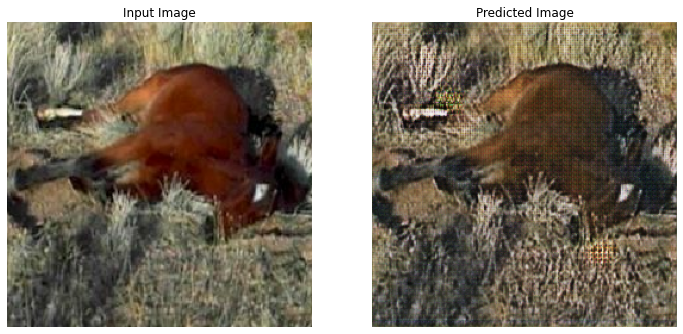

+--------------------------------------------------------------------------+
|                          EPOCH:  01/40 display                           |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 1     | 0:07:37.20 |      0.994 |      0.809 |       0.669 |       0.611 |
+-------+------------+------------+------------+-------------+-------------+


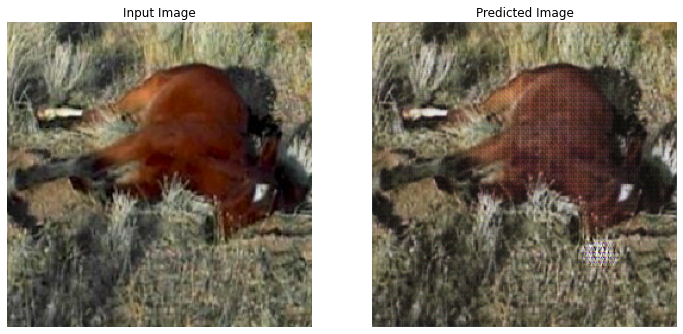

+--------------------------------------------------------------------------+
|                         EPOCH:  02/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 2     | 0:07:37.27 |      1.070 |      0.829 |       0.663 |       0.582 |
+-------+------------+------------+------------+-------------+-------------+


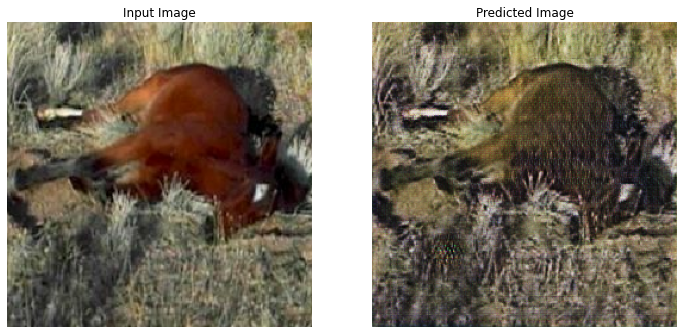

+--------------------------------------------------------------------------+
|                         EPOCH:  03/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 3     | 0:07:36.39 |      1.254 |      0.798 |       0.669 |       0.526 |
+-------+------------+------------+------------+-------------+-------------+


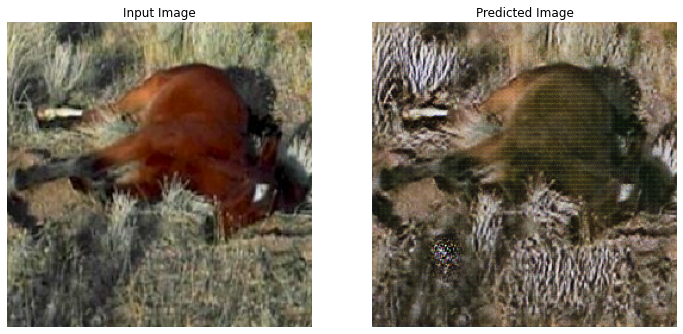

+--------------------------------------------------------------------------+
|                         EPOCH:  04/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 4     | 0:07:37.14 |      1.301 |      0.797 |       0.666 |       0.508 |
+-------+------------+------------+------------+-------------+-------------+


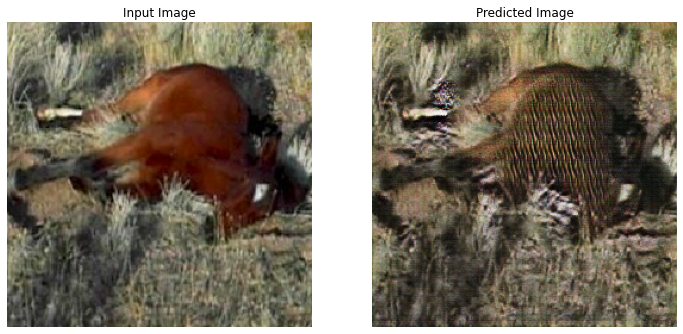

+--------------------------------------------------------------------------+
|                         EPOCH:  05/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 5     | 0:07:37.11 |      1.340 |      0.794 |       0.668 |       0.494 |
+-------+------------+------------+------------+-------------+-------------+


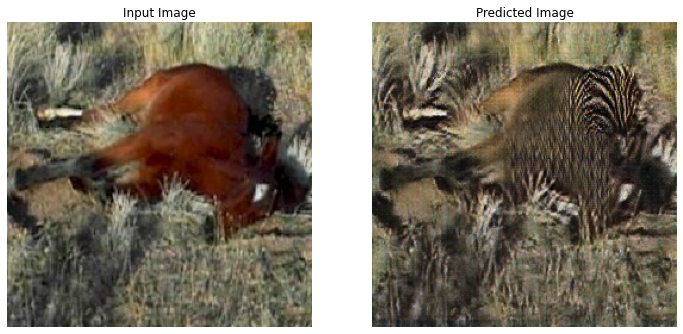

+--------------------------------------------------------------------------+
|                         EPOCH:  06/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 6     | 0:07:36.73 |      1.440 |      0.804 |       0.663 |       0.474 |
+-------+------------+------------+------------+-------------+-------------+


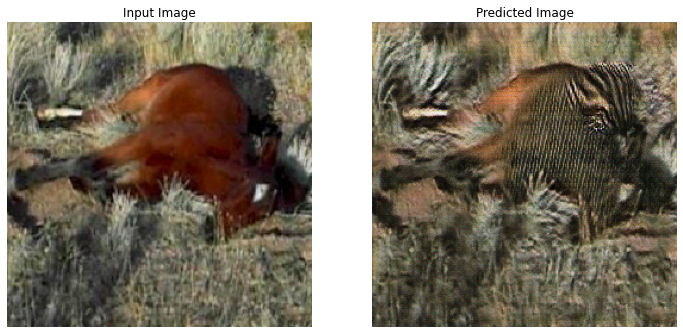

+--------------------------------------------------------------------------+
|                         EPOCH:  07/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 7     | 0:07:37.08 |      1.457 |      0.802 |       0.665 |       0.465 |
+-------+------------+------------+------------+-------------+-------------+


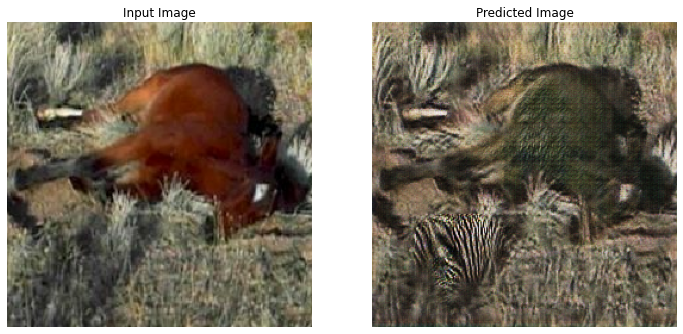

+--------------------------------------------------------------------------+
|                         EPOCH:  08/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 8     | 0:07:37.09 |      1.533 |      0.805 |       0.663 |       0.444 |
+-------+------------+------------+------------+-------------+-------------+


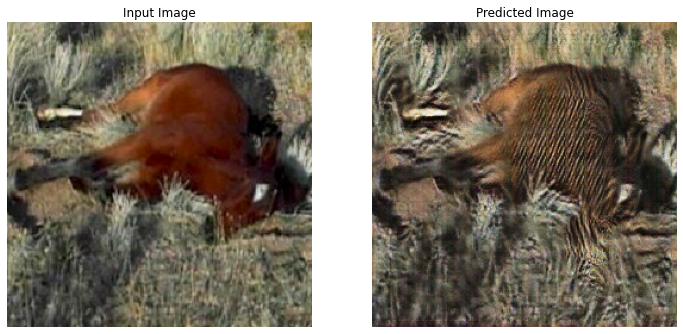

+--------------------------------------------------------------------------+
|                         EPOCH:  09/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 9     | 0:07:37.00 |      1.518 |      0.812 |       0.658 |       0.453 |
+-------+------------+------------+------------+-------------+-------------+
Saving checkpoint for epoch 10 at ./checkpoints/train/ckpt-1
+--------------------------------------------------------------------------+
|                          EPOCH:  10/40 display                           |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 10    | 0:07:

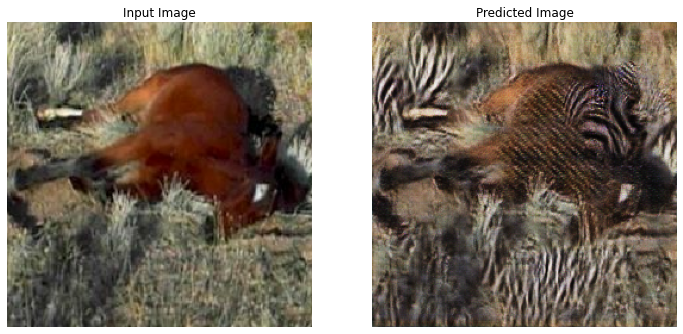

+--------------------------------------------------------------------------+
|                         EPOCH:  11/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 11    | 0:07:36.94 |      1.534 |      0.816 |       0.657 |       0.445 |
+-------+------------+------------+------------+-------------+-------------+


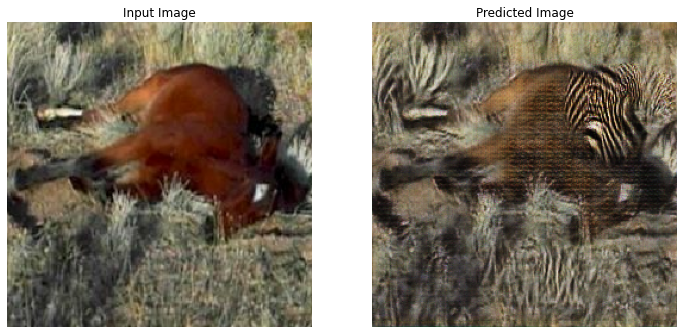

+--------------------------------------------------------------------------+
|                         EPOCH:  12/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 12    | 0:07:36.86 |      1.529 |      0.816 |       0.657 |       0.441 |
+-------+------------+------------+------------+-------------+-------------+


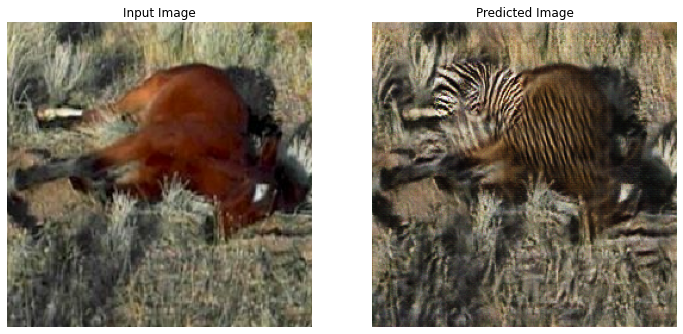

+--------------------------------------------------------------------------+
|                         EPOCH:  13/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 13    | 0:07:36.96 |      1.543 |      0.804 |       0.660 |       0.436 |
+-------+------------+------------+------------+-------------+-------------+


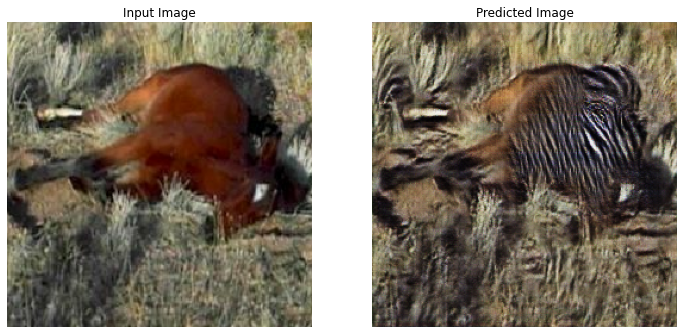

+--------------------------------------------------------------------------+
|                         EPOCH:  14/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 14    | 0:07:36.97 |      1.578 |      0.820 |       0.656 |       0.428 |
+-------+------------+------------+------------+-------------+-------------+


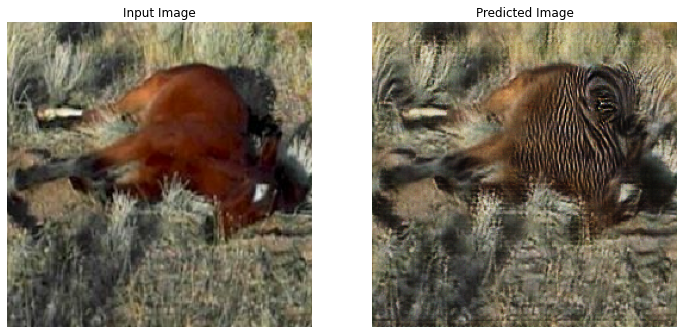

+--------------------------------------------------------------------------+
|                         EPOCH:  15/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 15    | 0:07:37.10 |      1.598 |      0.819 |       0.653 |       0.417 |
+-------+------------+------------+------------+-------------+-------------+


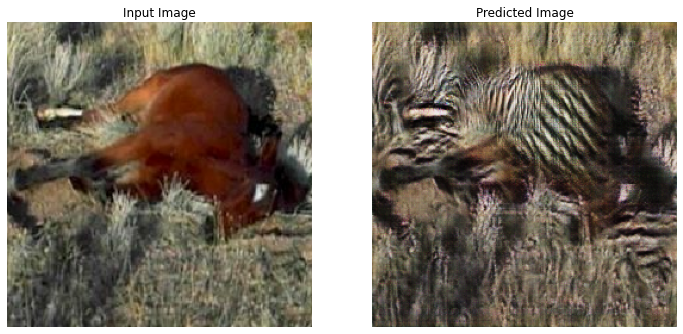

+--------------------------------------------------------------------------+
|                         EPOCH:  16/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 16    | 0:07:37.11 |      1.595 |      0.819 |       0.655 |       0.429 |
+-------+------------+------------+------------+-------------+-------------+


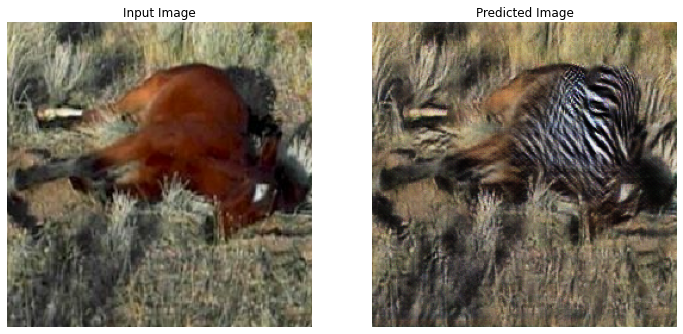

+--------------------------------------------------------------------------+
|                         EPOCH:  17/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 17    | 0:07:37.04 |      1.648 |      0.835 |       0.648 |       0.422 |
+-------+------------+------------+------------+-------------+-------------+


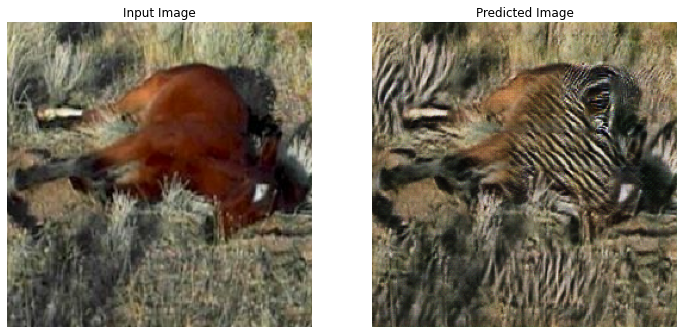

+--------------------------------------------------------------------------+
|                         EPOCH:  18/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 18    | 0:07:37.12 |      1.599 |      0.834 |       0.648 |       0.417 |
+-------+------------+------------+------------+-------------+-------------+


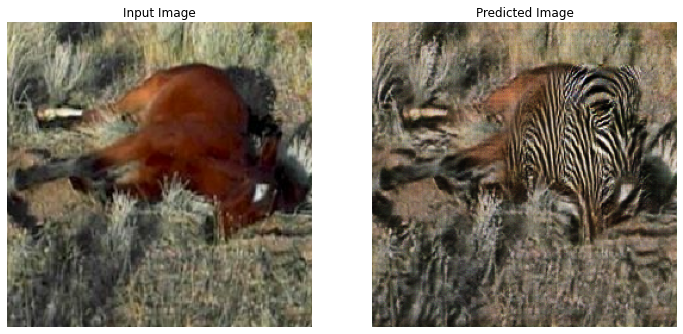

+--------------------------------------------------------------------------+
|                         EPOCH:  19/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 19    | 0:07:37.25 |      1.606 |      0.836 |       0.651 |       0.418 |
+-------+------------+------------+------------+-------------+-------------+
Saving checkpoint for epoch 20 at ./checkpoints/train/ckpt-2
+--------------------------------------------------------------------------+
|                          EPOCH:  20/40 display                           |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 20    | 0:07:

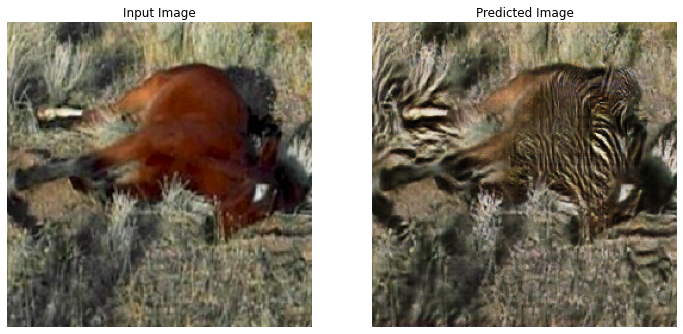

+--------------------------------------------------------------------------+
|                         EPOCH:  21/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 21    | 0:07:37.68 |      1.581 |      0.845 |       0.647 |       0.428 |
+-------+------------+------------+------------+-------------+-------------+


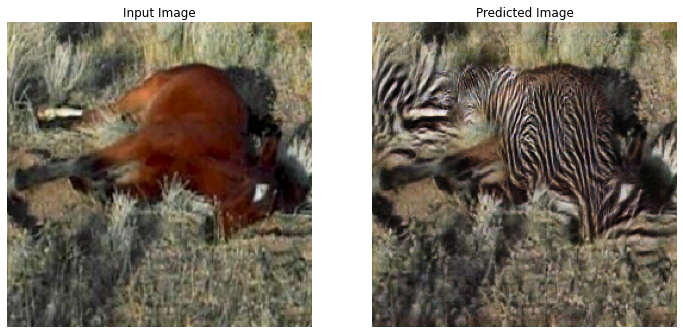

+--------------------------------------------------------------------------+
|                         EPOCH:  22/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 22    | 0:07:37.29 |      1.595 |      0.844 |       0.647 |       0.422 |
+-------+------------+------------+------------+-------------+-------------+


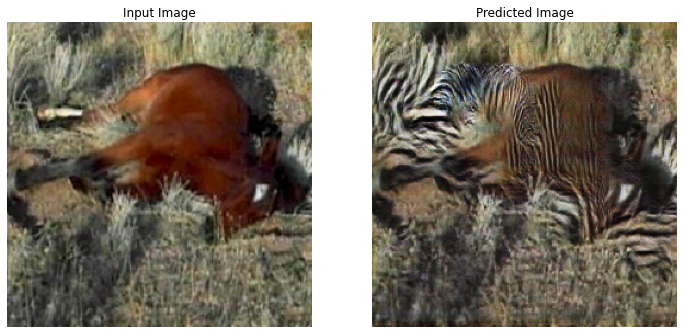

+--------------------------------------------------------------------------+
|                         EPOCH:  23/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 23    | 0:07:37.48 |      1.644 |      0.851 |       0.643 |       0.403 |
+-------+------------+------------+------------+-------------+-------------+


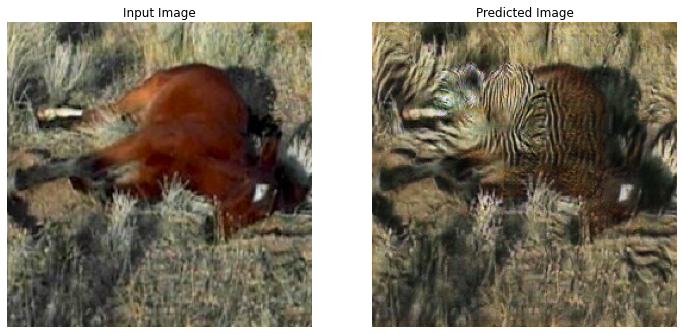

+--------------------------------------------------------------------------+
|                         EPOCH:  24/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 24    | 0:07:37.32 |      1.620 |      0.843 |       0.644 |       0.417 |
+-------+------------+------------+------------+-------------+-------------+


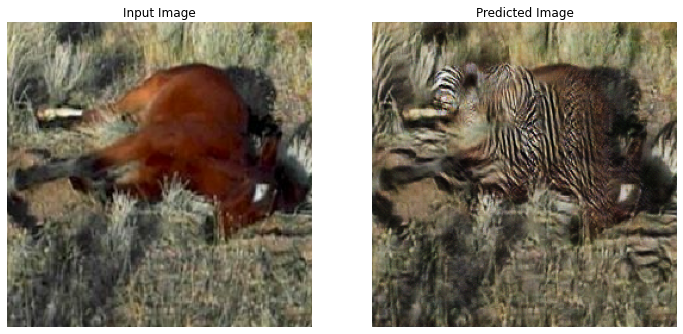

+--------------------------------------------------------------------------+
|                         EPOCH:  25/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 25    | 0:07:37.25 |      1.635 |      0.843 |       0.645 |       0.418 |
+-------+------------+------------+------------+-------------+-------------+


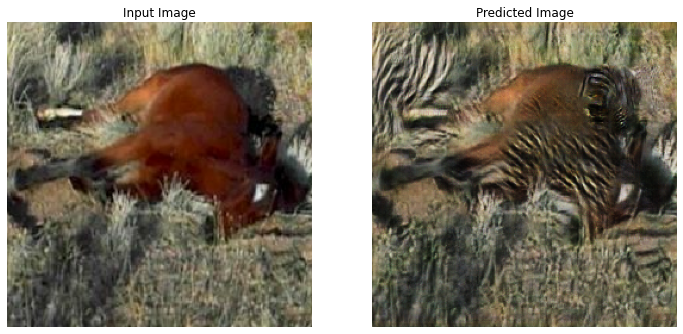

+--------------------------------------------------------------------------+
|                         EPOCH:  26/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 26    | 0:07:37.30 |      1.618 |      0.841 |       0.648 |       0.410 |
+-------+------------+------------+------------+-------------+-------------+


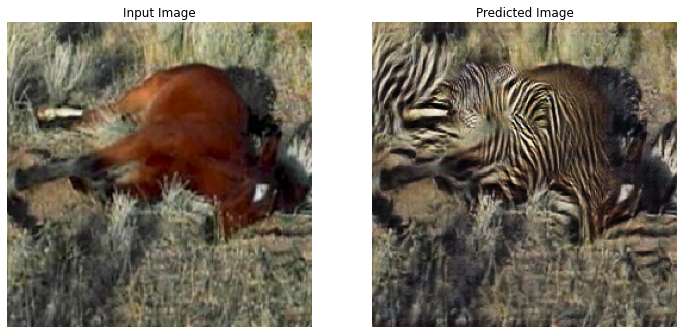

+--------------------------------------------------------------------------+
|                         EPOCH:  27/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 27    | 0:07:36.99 |      1.676 |      0.853 |       0.640 |       0.404 |
+-------+------------+------------+------------+-------------+-------------+


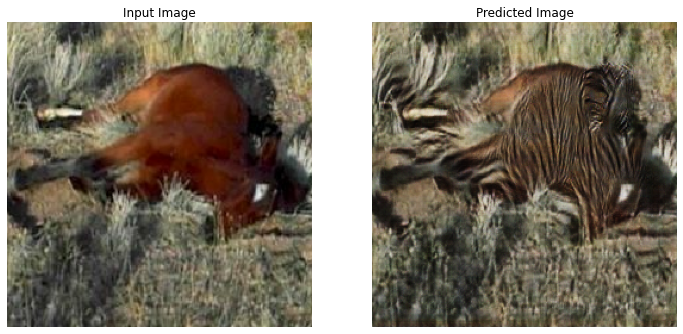

+--------------------------------------------------------------------------+
|                         EPOCH:  28/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 28    | 0:07:37.23 |      1.604 |      0.846 |       0.647 |       0.419 |
+-------+------------+------------+------------+-------------+-------------+


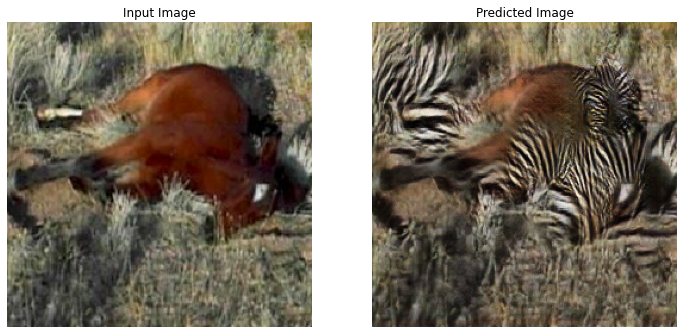

+--------------------------------------------------------------------------+
|                         EPOCH:  29/40 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 29    | 0:07:37.25 |      1.643 |      0.850 |       0.641 |       0.413 |
+-------+------------+------------+------------+-------------+-------------+


In [ ]:
fit(train_horses, train_zebras, EPOCHS)

### Generate images from the test dataset.

In [ ]:
# Run the trained model on the test dataset
for inp in test_horses.take(5):
  generate_images(generator_g, inp)

### Credits.

* [TensorFlow tutorial](https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/cyclegan.ipynb#scrollTo=ABGiHY6fE02b)

### Aditional resources.
* [Pix2Pix](https://www.tensorflow.org/tutorials/generative/pix2pix) 

* [ResNet paper](https://arxiv.org/abs/1703.10593)

*  [TensorFlow Datasets](https://www.tensorflow.org/datasets/catalog/cycle_gan). 

